Name: <b>Rajnita Leichombam</b> <br>
USC-ID: <b>1370432160</b><br>
Github Username: <b>Rajnita</b>

# <div align="center"> HOMEWORK 2</div>

The dataset contains data points collected from a Combined Cycle Power Plant over
6 years (2006-2011), when the power plant was set to work with full load. Features
consist of hourly average ambient variables Temperature (T), Ambient Pressure (AP),
Relative Humidity (RH) and Exhaust Vacuum (V) to predict the net hourly electrical
energy output (EP) of the plant.<br>
(a) Download the Combined Cycle Power Plant data1
from:
https://archive.ics.uci.edu/ml/datasets/Combined+Cycle+Power+Plant

<i>The data is downloaded and store under ../data/CCPP directory</i>

#### (b) Exploring the data:
i. How many rows are in this data set? How many columns? What do the rows
and columns represent?



In [1]:
##ALL THE IMPORTS OF THIS FILE
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import OLSInfluence
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from statsmodels.tools.eval_measures import rmse
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn import preprocessing
from statsmodels.tools.eval_measures import mse

### READING DATASET and CALCULATING NUMBER OF ROWS AND COLUMNS

In [2]:
df = pd.read_excel('../data/CCPP/Folds5x2_pp.xlsx','Sheet1')
df.head()

,AT,V,AP,RH,PE
0,14.96,41.76,1024.07,73.17,463.26
1,25.18,62.96,1020.04,59.08,444.37
2,5.11,39.40,1012.16,92.14,488.56
3,20.86,57.32,1010.24,76.64,446.48
4,10.82,37.50,1009.23,96.62,473.90


In [3]:
column_names=list(df.columns)
no_of_rows=len(df)
no_of_cols=len(column_names)
print('Number of rows: ',no_of_rows)
print('Number of columns: ',no_of_cols)

Number of rows:  9568
Number of columns:  5


<span style="color:darkblue">

The number of rows and cols are printed in the above cell. <br>
Each row represents an observation or a sample or an instance of data collected from a Combined Cycle Power Plant.<br>
Each column represents a variable - the input variables to the model (also called predictors or features) and the output (also known as the response or target variable) of the model <br>
    
<br>
As stated in the website https://archive.ics.uci.edu/ml/datasets/Combined+Cycle+Power+Plant,
the Features i.e each of the column consist of hourly average ambient variables<br>
- Temperature (AT) in the range 1.81°C and 37.11°C,<br>
- Ambient Pressure (AP) in the range 992.89-1033.30 milibar,<br>
- Relative Humidity (RH) in the range 25.56% to 100.16%<br>
- Exhaust Vacuum (V) in teh range 25.36-81.56 cm Hg<br>
- Net hourly electrical energy output (PE) 420.26-495.76 MW<br><br>
Each row  shows the net hourly electrical energy output (EP) of the plant when the plant is set to work on the (hourly average)input variables Temperature (T), Ambient Pressure (AP), Relative Humidity (RH) and Exhaust Vacuum (V) 

</span>


ii. Make pairwise scatterplots of all the variables in the data set including the
predictors (independent variables) with the dependent variable. Describe
your findings.

### PAIRWISE SCATTERPLOT

Text(0.5, 0.98, 'Scatter plot of the independent variables and dependent variable')

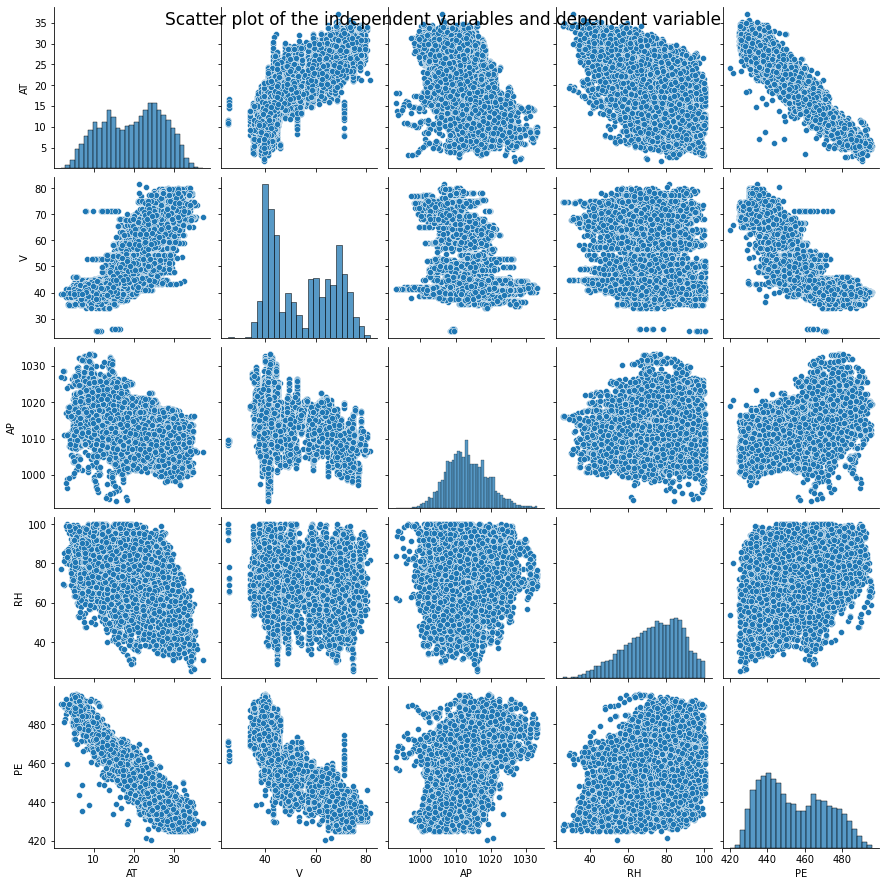

In [4]:
pairGrid=sns.pairplot(df)
pairGrid.fig.suptitle("Scatter plot of the independent variables and dependent variable", fontsize=17)

In [5]:
print("**************CORRELATION OF THE VARIABLES******************")
df.corr()

**************CORRELATION OF THE VARIABLES******************


,AT,V,AP,RH,PE
AT,1.000000,0.844107,-0.507549,-0.542535,-0.948128
V,0.844107,1.000000,-0.413502,-0.312187,-0.869780
AP,-0.507549,-0.413502,1.000000,0.099574,0.518429
RH,-0.542535,-0.312187,0.099574,1.000000,0.389794
PE,-0.948128,-0.869780,0.518429,0.389794,1.000000


<span style="color:darkblue">
From the above scatterplot, these are some of the findings</br>
- AT Temperature has a strong negative correlation with PE i.e. energy output as we see a downhill pattern of tightly clustered data</br>
- AT-Temperature and V has a strong positive correlation as we see an uphill pattern of datapoints clustered tightly.
As temperature increases, the plot shows that vaccum exhaust increases</br>
- It is clear that, there exists some linear relationships between some of the variables. For example, PE(Energy output) has a strong negative relationship with temperature(AT) and exhaust vaccuum (V).
With decrease in temperature and exhaust vaccum, the energy output increases</br>
- The strength of the relationship between some of the variables is less. For example, the correlation between AP and RH is less. The data points are scattered all over the graph for AP Vs RH.</br>
- It is obvious that a variable have a correlation of 1 with itself
</span>

iii. What are the mean, the median, range, first and third quartiles, and interquartile ranges of each of the variables in the dataset? Summarize them
in a table.

### STATISTICS OF THE VARIABLES

In [6]:
data={'Statistics':['Mean', 'Median','Range','First Quartile','Third Quartile', 'Interquartile'],
      'AT':[df["AT"].mean(),df["AT"].median(),df["AT"].max()-df["AT"].min(),df.AT.quantile(0.25),df.AT.quantile(0.75), df.AT.quantile(0.75)-df.AT.quantile(0.25)],
      'V':[df["V"].mean(),df["V"].median(),df["V"].max()-df["V"].min(),df.V.quantile(0.25),df.V.quantile(0.75), df.V.quantile(0.75)-df.V.quantile(0.25)],
      'AP':[df["AP"].mean(),df["AP"].median(),df["AP"].max()-df["AP"].min(),df.AP.quantile(0.25),df.AP.quantile(0.75), df.AP.quantile(0.75)-df.AP.quantile(0.25)],
      'RH':[df["RH"].mean(),df["RH"].median(),df["RH"].max()-df["RH"].min(),df.RH.quantile(0.25),df.RH.quantile(0.75), df.RH.quantile(0.75)-df.RH.quantile(0.25)],
      'PE':[df["PE"].mean(),df["PE"].median(),df["PE"].max()-df["PE"].min(),df.PE.quantile(0.25),df.PE.quantile(0.75), df.PE.quantile(0.75)-df.PE.quantile(0.25)]
     }

table = pd.DataFrame(data)
table.style

,Statistics,AT,V,AP,RH,PE
0,Mean,19.651231,54.305804,1013.259078,73.308978,454.365009
1,Median,20.345000,52.080000,1012.940000,74.975000,451.550000
2,Range,35.300000,56.200000,40.410000,74.600000,75.500000
3,First Quartile,13.510000,41.740000,1009.100000,63.327500,439.750000
4,Third Quartile,25.720000,66.540000,1017.260000,84.830000,468.430000
5,Interquartile,12.210000,24.800000,8.160000,21.502500,28.680000


<span style="color:darkblue">
    The above table shows the required statistics. 
</span>

c) For each predictor, fit a simple linear regression model to predict the response.
Describe your results. In which of the models is there a statistically significant
association between the predictor and the response? Create some plots to back
up your assertions. Are there any outliers that you would like to remove from
your data for each of these regression tasks?

### LINEAR REGRESSION MODEL FOR EACH OF THE PREDICTORS

#### AT Temperature Vs PE Energy Output

In [7]:
at_pe_model = smf.ols(formula='PE ~ AT', data=df).fit() 
print(at_pe_model.summary())

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.899
Method:                 Least Squares   F-statistic:                 8.510e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:04   Log-Likelihood:                -29756.
No. Observations:                9568   AIC:                         5.952e+04
Df Residuals:                    9566   BIC:                         5.953e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    497.0341      0.156   3177.280      0.0


<span style="color:darkblue">

<b>OBSERVATION<b><br>
    The predictor AT has p-value =0 which is less than 0.05, there exist a statistical significant relationship between the predictor AT and response PE


<b>DESCRIPTION<b><br>
  - R-squared value is 0.899. High R-squared shows that the data fit the regression model well. This can be seen in the plotted graph below as well. R-Squared. It tells the amount of variance in the dependent variable that the independent variables explain. Here Rsquared is equal to adjusted Rsquared too.
    89.9% of the variance in the energy output is explained by this predictor AT in this model
  - If temperature is 0, then the energy output is 497.0341 MegaWatts (the intercept value)
  - p-value=0<0.05, so it is statistically significant. We can have confidence that temperature does affect energy output                
</span>

Intercept    497.03412
AT            -2.17132
dtype: float64


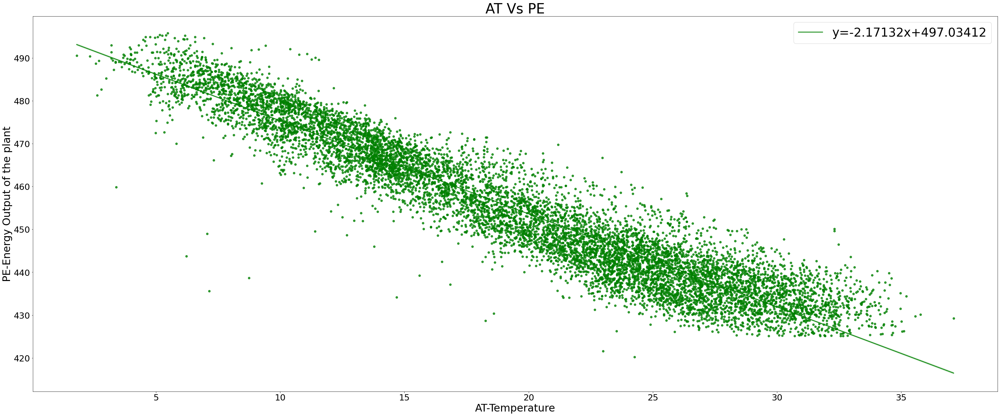

In [8]:
at_pe_model_params = at_pe_model.params
print(at_pe_model_params)

plt.figure(figsize=(50,20))
ax = sns.regplot(x="AT", y="PE", data=df, color='green', 
line_kws={'label':"y={0:.5f}x+{1:.5f}".format(at_pe_model_params.AT,at_pe_model_params.Intercept)})

# plot legend
ax.legend(fontsize=35)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('AT-Temperature', fontsize=30)
plt.ylabel('PE-Energy Output of the plant',fontsize=30)
plt.title('AT Vs PE', fontsize=40)
plt.show()

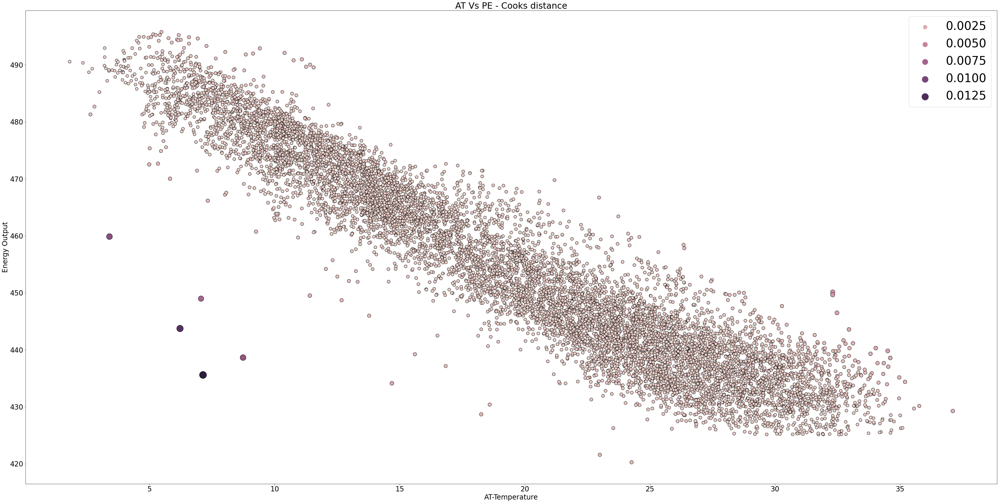

In [9]:
# calculate the cooks_distance - the OLSInfluence object contains multiple influence measurements
at_cook_distance = OLSInfluence(at_pe_model).cooks_distance
(at_distance, p_value) = at_cook_distance
plt.figure(figsize=(60,30))
ax=sns.scatterplot(x=df.AT, y=df.PE, hue=at_distance,size=at_distance, sizes=(100, 600), edgecolor='black', linewidth=1)
ax.legend(fontsize=40)
# ticks
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# labels and title
plt.xlabel('AT-Temperature', fontsize=24)
plt.ylabel('Energy Output', fontsize=24)
plt.title('AT Vs PE - Cooks distance', fontsize=30);
plt.show()

The number of observations that are outliers considering 4/N threshold is: 416


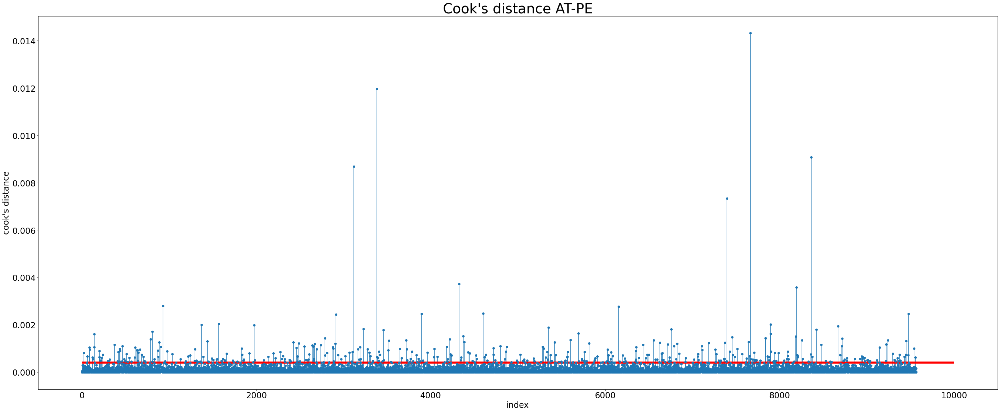

In [10]:
##COOKS DISTANCE THRESHOLD
threshold_val = 4/no_of_rows
plt.figure(figsize=(50,20))
# stem plot - the x-axis represents the index of the observation and the y-axis its Cook's distance
plt.stem(at_distance, basefmt=" ")
# horizontal line showing the threshold value
plt.hlines(threshold_val, -2, 10000, 'r',linewidth=6)
#plt.figure(figsize=(70,30))
# the observations with Cook's distances higher than the threshold value are labeled in the plot
at_influential_data = at_distance[at_distance > threshold_val]
print('The number of observations that are outliers considering 4/N threshold is:',len(at_influential_data))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# labels and title
plt.xlabel('index', fontsize=24)
plt.ylabel('cook\'s distance', fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Cook\'s distance AT-PE', fontsize=40);

<span style="color:darkblue">


Cooks distance is to find the influential outliers in a set of predictor variables. It helps to detect datapoints that significantly affect the regression coefficients negatively.
In a way, it helpss to find the highly influential data or outliers.
It is measured by considering each observation's leverage and residual values. The more a datapoint differs from mean of other x-values, the more leverage it is.
More leverage and more residual values can result in high cook's distance.
Higher the cooks distance, means the observation is more influential.

Using the cut off value as 4/N in Cook's distance, where N is the number of observation, the datapoints above the red line in the plot can be removed, i.e 416 observations as printed above
</span>

#### V Exhaust Vacuum Vs PE Energy Output

In [11]:
v_pe_model = smf.ols(formula='PE ~ V', data=df).fit() 
print(v_pe_model.summary())

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                 2.972e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:06   Log-Likelihood:                -33963.
No. Observations:                9568   AIC:                         6.793e+04
Df Residuals:                    9566   BIC:                         6.794e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    517.8015      0.378   1370.218      0.0


<span style="color:darkblue">

<b>OBSERVATION<b><br>
    The predictor V has p-value =0 which is less than 0.05, there exist a statistical significant relationship between the predictor V and response PE


<b>DESCRIPTION<b><br>
  - R-squared value is 0.757. It tells the amount of variance in the dependent variable that the independent variables explain. Here Rsquared is equal to adjusted Rsquared too. 75.7% of the variance in the energy output is explained by this predictor V in this model
  - If exhaust vaccuum is 0, then the energy output is 517.8015 MegaWatts (the intercept value)
  - p-value=0<0.05, so it is statistically significant. We can have confidence that exhaust vaccuum does affect energy output                
</span>

Intercept    517.801526
V             -1.168135
dtype: float64


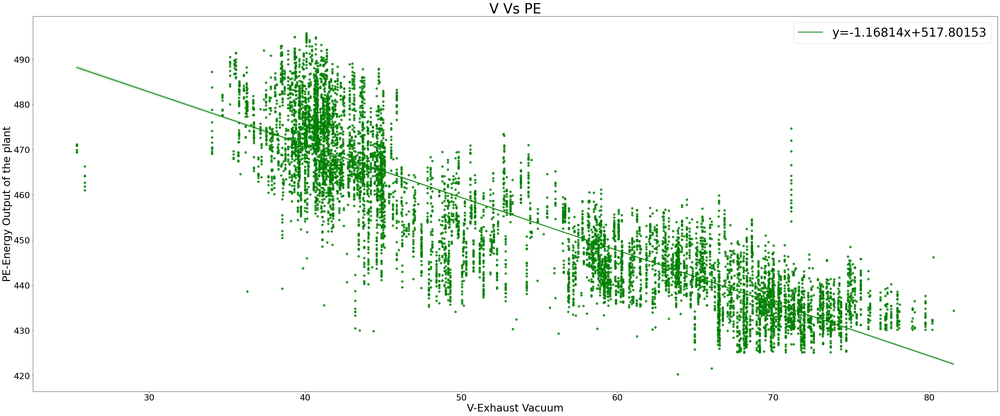

In [12]:
v_pe_model_params = v_pe_model.params
print(v_pe_model_params)
plt.figure(figsize=(50,20))
ax = sns.regplot(x="V", y="PE", data=df, color='green', 
line_kws={'label':"y={0:.5f}x+{1:.5f}".format(v_pe_model_params.V,v_pe_model_params.Intercept)})

# plot legend
ax.legend(fontsize=35)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('V-Exhaust Vacuum', fontsize=30)
plt.ylabel('PE-Energy Output of the plant',fontsize=30)
plt.title('V Vs PE', fontsize=40)
plt.show()

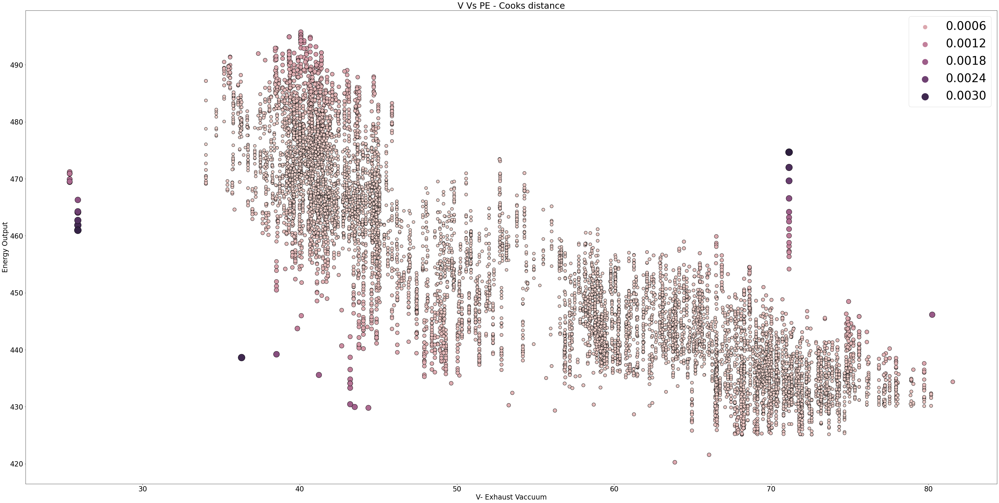

In [13]:
v_cook_distance = OLSInfluence(v_pe_model).cooks_distance
(v_distance, p_value) = v_cook_distance
plt.figure(figsize=(60,30))

ax=sns.scatterplot(x=df.V, y=df.PE, hue=v_distance,size=v_distance, sizes=(100, 600), edgecolor='black', linewidth=1)
ax.legend(fontsize=40)
# ticks
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# labels and title
plt.xlabel('V- Exhaust Vaccuum', fontsize=24)
plt.ylabel('Energy Output', fontsize=24)
plt.title('V Vs PE - Cooks distance', fontsize=30);
plt.show()

The number of observations that are outliers considering 4/N threshold is: 423


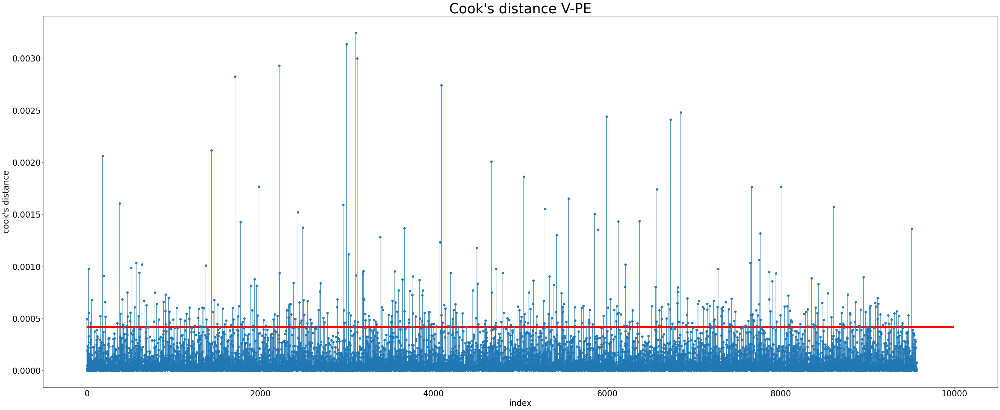

In [14]:
##COOKS DISTANCE THRESHOLD
threshold_val = 4/no_of_rows
plt.figure(figsize=(50,20))
# stem plot - the x-axis represents the index of the observation and the y-axis its Cook's distance
plt.stem(v_distance, basefmt=" ")
# horizontal line showing the threshold value
plt.hlines(threshold_val, -2, 10000, 'r',linewidth=6)
#plt.figure(figsize=(70,30))
# the observations with Cook's distances higher than the threshold value are labeled in the plot
v_influential_data = v_distance[v_distance > threshold_val]
print('The number of observations that are outliers considering 4/N threshold is:',len(v_influential_data))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# labels and title
plt.xlabel('index', fontsize=24)
plt.ylabel('cook\'s distance', fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Cook\'s distance V-PE', fontsize=40);

<span style="color:darkblue">
Using the cut off value as 4/N in Cook's distance, where N is the number of observation, the datapoints above the red line in the plot can be removed, i.e 423 observations as printed above
</span>

#### AP  Vs PE Energy Output

In [15]:
ap_pe_model = smf.ols(formula='PE ~ AP', data=df).fit() 
print(ap_pe_model.summary())

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.269
Model:                            OLS   Adj. R-squared:                  0.269
Method:                 Least Squares   F-statistic:                     3516.
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:08   Log-Likelihood:                -39224.
No. Observations:                9568   AIC:                         7.845e+04
Df Residuals:                    9566   BIC:                         7.847e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1055.2610     25.459    -41.449      0.0


<span style="color:darkblue">

<b>OBSERVATION<b><br>
    The predictor AP has p-value =0 which is less than 0.05, there exist a statistical significant relationship between the predictor AP and response PE


<b>DESCRIPTION<b><br>
  - R-squared value is 0.269. It tells the amount of variance in the dependent variable that the independent variables explain. 26.9% of the variance in the energy output is explained by this predictor AP in this model
  - If AP ambient pressure is 0, then the energy output is -1055.2610 MegaWatts (the intercept value). The energy is negative if AP is 0.
</span>

Intercept   -1055.260989
AP              1.489872
dtype: float64


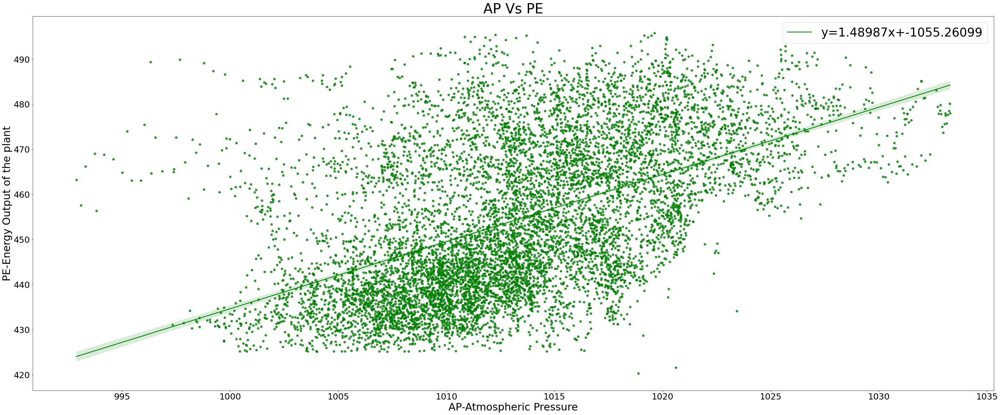

In [16]:
ap_pe_model_params = ap_pe_model.params
print(ap_pe_model_params)
plt.figure(figsize=(50,20))
ax = sns.regplot(x="AP", y="PE", data=df, color='green', 
line_kws={'label':"y={0:.5f}x+{1:.5f}".format(ap_pe_model_params.AP,ap_pe_model_params.Intercept)})

# plot legend
ax.legend(fontsize=35)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('AP-Atmospheric Pressure', fontsize=30)
plt.ylabel('PE-Energy Output of the plant',fontsize=30)
plt.title('AP Vs PE', fontsize=40)
plt.show()

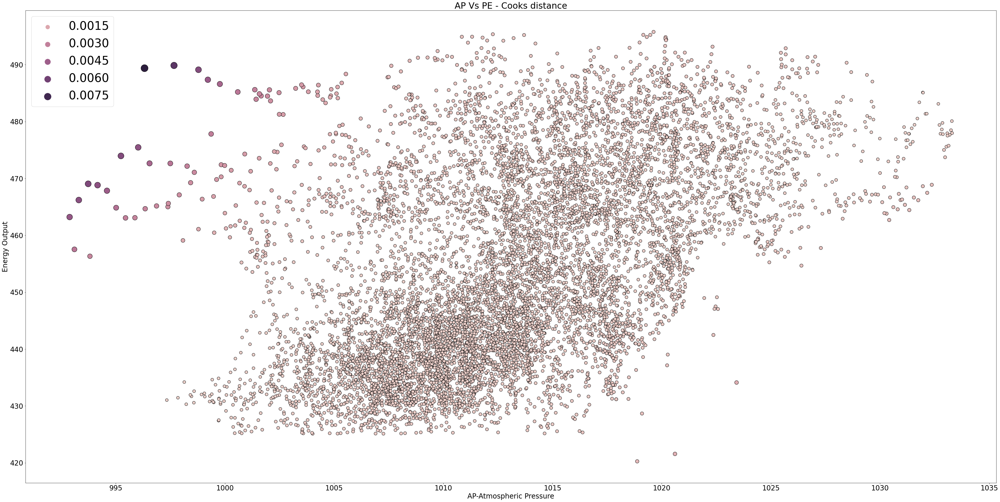

In [17]:
ap_cook_distance = OLSInfluence(ap_pe_model).cooks_distance
(ap_distance, p_value) = ap_cook_distance
plt.figure(figsize=(60,30))

# scatter plot - x axis (independent variable height), y-axis (dependent variable weight), size and color of the marks according to its cook's distance
ax=sns.scatterplot(x=df.AP, y=df.PE, hue=ap_distance,size=ap_distance, sizes=(100, 600), edgecolor='black', linewidth=1)
ax.legend(fontsize=40)
# ticks
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
# labels and title
plt.xlabel('AP-Atmospheric Pressure', fontsize=24)
plt.ylabel('Energy Output', fontsize=24)
plt.title('AP Vs PE - Cooks distance', fontsize=30);
plt.show()

The number of observations that are outliers considering 4/N threshold is: 300


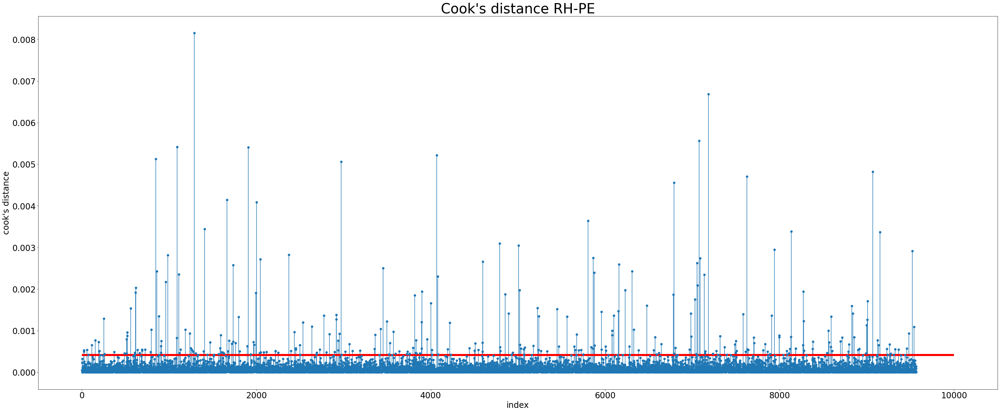

In [18]:
##COOKS DISTANCE THRESHOLD
threshold_val = 4/no_of_rows
plt.figure(figsize=(50,20))
# stem plot - the x-axis represents the index of the observation and the y-axis its Cook's distance
plt.stem(ap_distance, basefmt=" ")
# horizontal line showing the threshold value
plt.hlines(threshold_val, -2, 10000, 'r',linewidth=6)
#plt.figure(figsize=(70,30))
# the observations with Cook's distances higher than the threshold value are labeled in the plot
ap_influential_data = ap_distance[ap_distance > threshold_val]
print('The number of observations that are outliers considering 4/N threshold is:',len(ap_influential_data))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# labels and title
plt.xlabel('index', fontsize=24)
plt.ylabel('cook\'s distance', fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Cook\'s distance RH-PE', fontsize=40);

<span style="color:darkblue">
Using the cut off value as 4/N in Cook's distance, where N is the number of observation, the datapoints above the red line in the plot can be removed, i.e 300 observations as printed above
</span>

#### RH  Vs PE Energy Output

In [19]:
rh_pe_model = smf.ols(formula='PE ~ RH', data=df).fit() 
print(rh_pe_model.summary())

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     1714.
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:10   Log-Likelihood:                -39933.
No. Observations:                9568   AIC:                         7.987e+04
Df Residuals:                    9566   BIC:                         7.988e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    420.9618      0.823    511.676      0.0


<span style="color:darkblue">

<b>OBSERVATION<b><br>
    The predictor RH has p-value =0 which is less than 0.05, there exist a statistical significant relationship between the predictor RH and response PE


<b>DESCRIPTION<b><br>
  - R-squared value is 0.152. 15.2% of the variance in the energy output is explained by this predictor RH in this model, which is less.
  - If relative humidity is 0, then the energy output is 420.9618 MegaWatts (the intercept value)
  - p-value=0<0.05, so it is statistically significant. We can have confidence that exhaust vaccuum does affect energy output                
</span>

Intercept    420.961766
RH             0.455650
dtype: float64


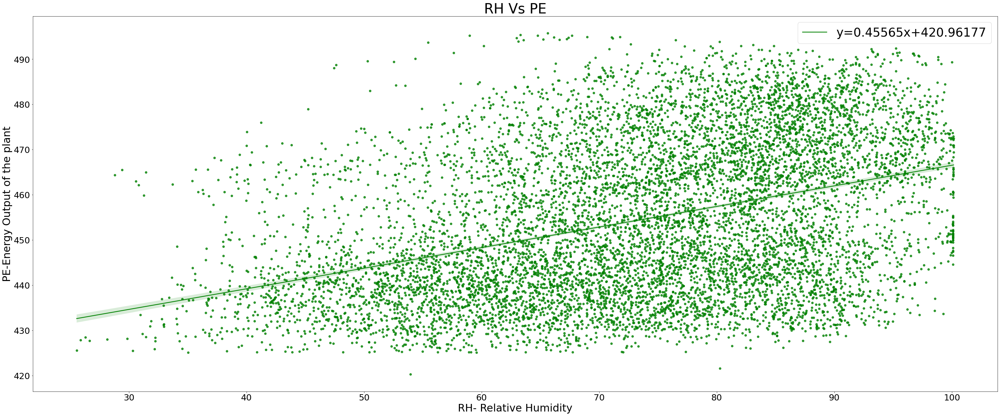

In [20]:
rh_pe_model_params = rh_pe_model.params
print(rh_pe_model_params)
plt.figure(figsize=(50,20))
ax = sns.regplot(x="RH", y="PE", data=df, color='green', 
line_kws={'label':"y={0:.5f}x+{1:.5f}".format(rh_pe_model_params.RH,rh_pe_model_params.Intercept)})

# plot legend
ax.legend(fontsize=35)
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.xlabel('RH- Relative Humidity', fontsize=30)
plt.ylabel('PE-Energy Output of the plant',fontsize=30)
plt.title('RH Vs PE', fontsize=40)
plt.show()

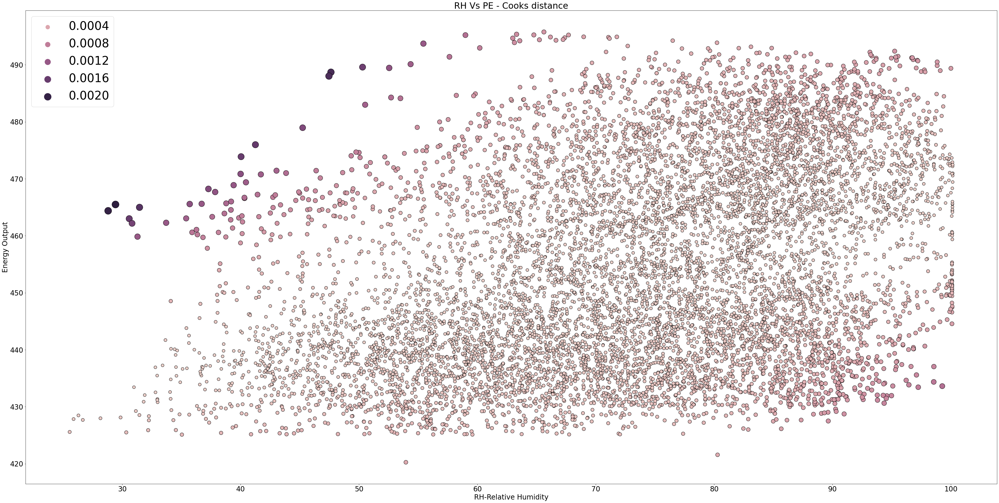

In [21]:
rh_cook_distance = OLSInfluence(rh_pe_model).cooks_distance
(rh_distance, p_value) = rh_cook_distance
plt.figure(figsize=(60,30))

# scatter plot - x axis (independent variable height), y-axis (dependent variable weight), size and color of the marks according to its cook's distance
ax=sns.scatterplot(x=df.RH, y=df.PE, hue=rh_distance, size=rh_distance, sizes=(100, 600), edgecolor='black', linewidth=1)
ax.legend(fontsize=40)
# ticks
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# labels and title
plt.xlabel('RH-Relative Humidity', fontsize=24)
plt.ylabel('Energy Output', fontsize=24)
plt.title('RH Vs PE - Cooks distance', fontsize=30);
plt.show()


The number of observations that are outliers considering 4/N threshold is: 249


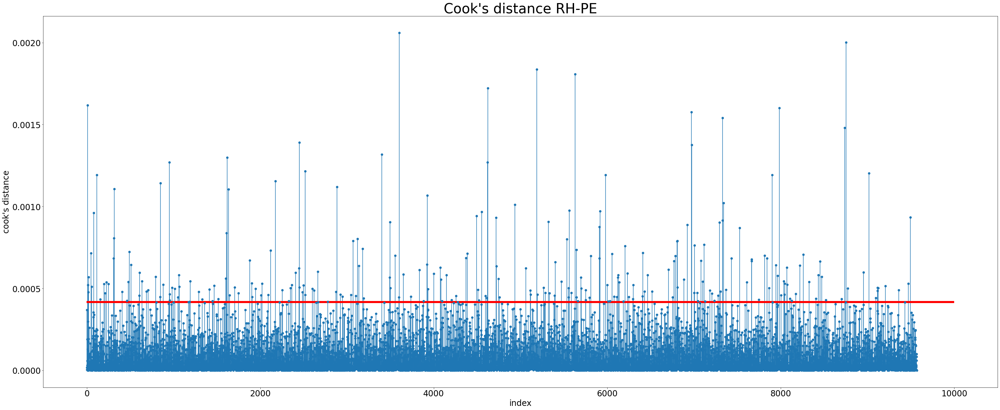

In [22]:
##COOKS DISTANCE THRESHOLD
threshold_val = 4/no_of_rows
plt.figure(figsize=(50,20))
# stem plot - the x-axis represents the index of the observation and the y-axis its Cook's distance
plt.stem(rh_distance, basefmt=" ")
# horizontal line showing the threshold value
plt.hlines(threshold_val, -2, 10000, 'r',linewidth=6)
#plt.figure(figsize=(70,30))
# the observations with Cook's distances higher than the threshold value are labeled in the plot
rh_influential_data = rh_distance[rh_distance > threshold_val]
print('The number of observations that are outliers considering 4/N threshold is:',len(rh_influential_data))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# labels and title
plt.xlabel('index', fontsize=24)
plt.ylabel('cook\'s distance', fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.title('Cook\'s distance RH-PE', fontsize=40);

<span style="color:darkblue">
Using the cut off value as 4/N in Cook's distance, where N is the number of observation, the datapoints above the red line in the plot can be removed, i.e 249 observations as printed above
</span>

<span style="color:darkred">
<b>After seeing all the models with each of the predictors, we found that in ALL the models, there is a statistically significant association between the predictor and the response 
<b>
</span>


(d) Fit a multiple regression model to predict the response using all of the predictors.
Describe your results. For which predictors can we reject the null hypothesis
H0 : βj = 0?

### MULTIPLE REGRESSION MODEL

In [23]:
multi_reg_model = smf.ols(formula='PE ~ AT + V + AP + RH', data=df).fit() 
#ANOTHER WAY TO DO
# X = sm.add_constant(df[['AT', 'V', 'AP', 'RH']])
# y = df.PE
# model = sm.OLS(y, X)
# results = model.fit()
# results.summary()
print(multi_reg_model.summary())

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 3.114e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:12   Log-Likelihood:                -28088.
No. Observations:                9568   AIC:                         5.619e+04
Df Residuals:                    9563   BIC:                         5.622e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    454.6093      9.749     46.634      0.0


<span style="color:darkblue">
<b>We can reject the null hypothesis for all predictors as p=0 for all predictors. Since p<0.05 for all, all the predictors are significant.</b> <br>
 R-squared is 0.929, which is high.<br>
 AT,V,RH has negative coefficients and hence, these features have a negative relationship with the energy output.
 As AT or V or RH increases, the energy output reduces.<br>
 RH has a positive coefficient , so as RH increases the energy output also increases
</span>


e) How do your results from 1c compare to your results from 1d? Create a plot
displaying the univariate regression coefficients from 1c on the x-axis, and the
multiple regression coefficients from 1d on the y-axis. That is, each predictor is
displayed as a single point in the plot. Its coefficient in a simple linear regression
model is shown on the x-axis, and its coefficient estimate in the multiple linear
regression model is shown on the y-axis.

### COMPARISON OF RESULTS FROM 1(c) and 1(d)

In [24]:
print('Coefficient from SIMPLE linear regression for individual predictors')
print('\nAT=',at_pe_model_params.AT)
print('V=',v_pe_model_params.V )
print('AP=',ap_pe_model_params.AP )
print('RH=',rh_pe_model_params.RH )

Coefficient from SIMPLE linear regression for individual predictors

AT= -2.1713199585178047
V= -1.1681351265557107
AP= 1.4898716733991129
RH= 0.45565010226298014


<span style="color:darkblue">
- In multi regression model, the coefficient of RH is negative (-0.1581 ), whereas in simple linear regression model, coefficient of RH is positive (0.4556). In simple regression, the coefficient is calculated ignoring all other predictors, while in multiple regression, all the predictors are considered.<br>
- p-value is 0 in both the models for all the predictors. So, all the features are statistically significant in both the type of models<br>
- Of all the simple regression models, The highest R-squared is 0.899 i.e. found for AT. In multiple regression mode, the R-squared is increased to 0.929 when all predictors are considered.
 
    
</span>

### PLOTTING REGRESSION COEFFICIENTS

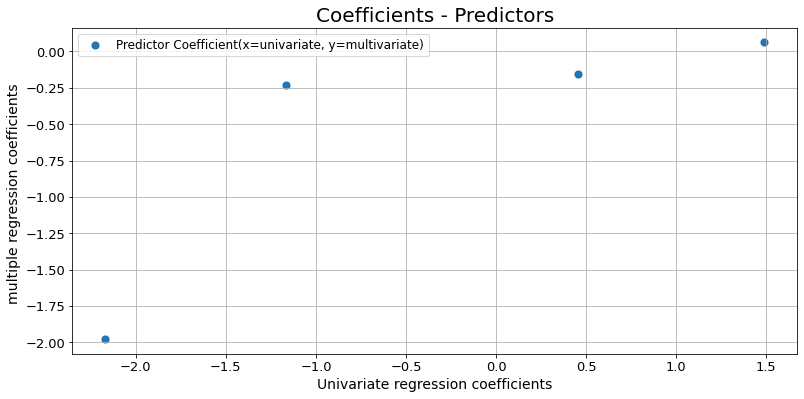

In [25]:
plt.figure(figsize=(13,6))

###CHECK IF SORTING IS NEEDED
coefficients = pd.DataFrame([[at_pe_model_params.AT,multi_reg_model.params.AT],
 [ v_pe_model_params.V,multi_reg_model.params.V],
 [ ap_pe_model_params.AP, multi_reg_model.params.AP],
 [rh_pe_model_params.RH,multi_reg_model.params.RH]], columns=["x", "y"])

color = ['red', 'black', 'blue', 'green']
sns.scatterplot(x=coefficients["x"], y=coefficients["y"],s=80).plot()

plt.grid()
plt.gca().legend(["Predictor Coefficient(x=univariate, y=multivariate)"],fontsize=12)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Univariate regression coefficients', fontsize=14)
plt.ylabel('multiple regression coefficients ',fontsize=14)
plt.title('Coefficients - Predictors', fontsize=20)
plt.show()


(f) Is there evidence of nonlinear association between any of the predictors and the
response? To answer this question, for each predictor X, fit a model of the form2
Y = β0 + β1X + β2X^2 + β3X^3 + E(epsilon)

### POLYNOMIAL REGRESSION FOR EACH PREDICTOR

#### AT Vs PE

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                 3.299e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:12   Log-Likelihood:                -29101.
No. Observations:                9568   AIC:                         5.821e+04
Df Residuals:                    9564   BIC:                         5.824e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        492.7281      0.673    732.248      0.0

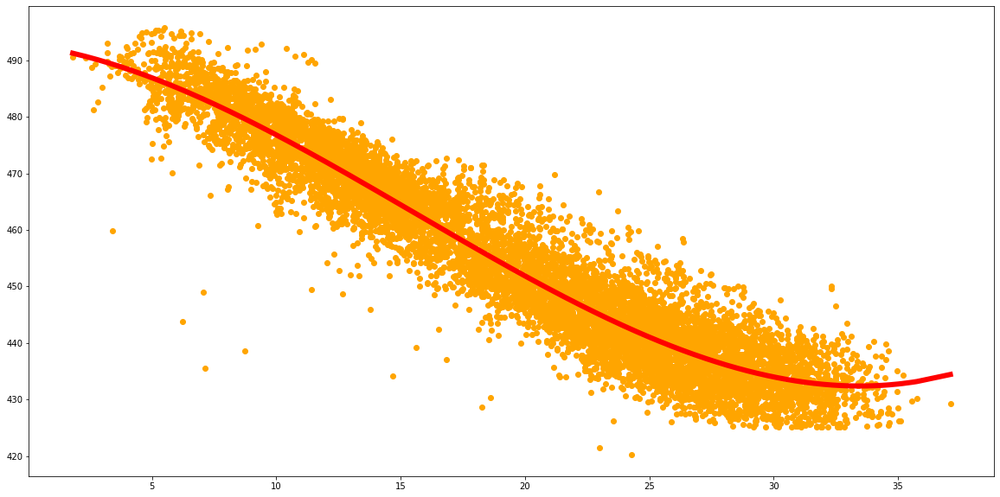

In [26]:
inds = df.AT.ravel().argsort()  # Sort x values and get index    
x = df.AT.ravel()[inds].reshape(-1,1)
y = df.PE[inds] #Sort y according to x sorted index
polynomial_features= PolynomialFeatures(degree=3)
xp = polynomial_features.fit_transform(x)

at_model = sm.OLS(y, xp).fit()

print(at_model.summary())
plt.figure(figsize=(20,10))
ypred = at_model.predict(xp) 
plt.scatter(x,y,color='orange')
plt.plot(x,ypred,color='red',linewidth=6)

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.775
Method:                 Least Squares   F-statistic:                 1.098e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:12   Log-Likelihood:                -33585.
No. Observations:                9568   AIC:                         6.718e+04
Df Residuals:                    9564   BIC:                         6.721e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        554.1468      9.151     60.557      0.0

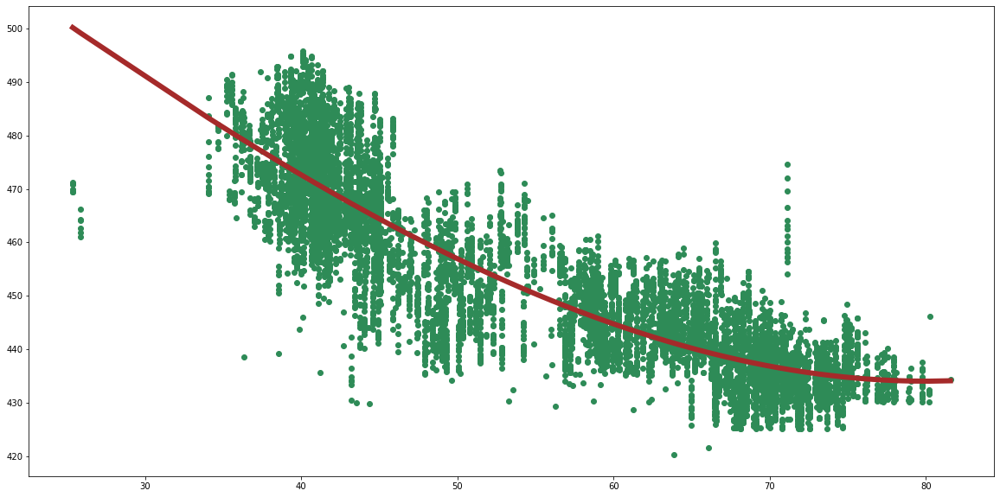

In [27]:
v_inds = df.V.ravel().argsort()  # Sort x values and get index    
v_x = df.V.ravel()[v_inds].reshape(-1,1)
v_y = df.PE[v_inds] #Sort y according to x sorted index
v_xp = polynomial_features.fit_transform(v_x)

plt.figure(figsize=(20,10))
v_model = sm.OLS(v_y, v_xp).fit()
v_ypred = v_model.predict(v_xp) 

print(v_model.summary())

plt.scatter(v_x,v_y,color='seagreen')
plt.plot(v_x,v_ypred,color='brown',linewidth=6)


                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.275
Model:                            OLS   Adj. R-squared:                  0.275
Method:                 Least Squares   F-statistic:                     1813.
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:12   Log-Likelihood:                -39184.
No. Observations:                9568   AIC:                         7.837e+04
Df Residuals:                    9565   BIC:                         7.840e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0747      0.009      8.415      0.0

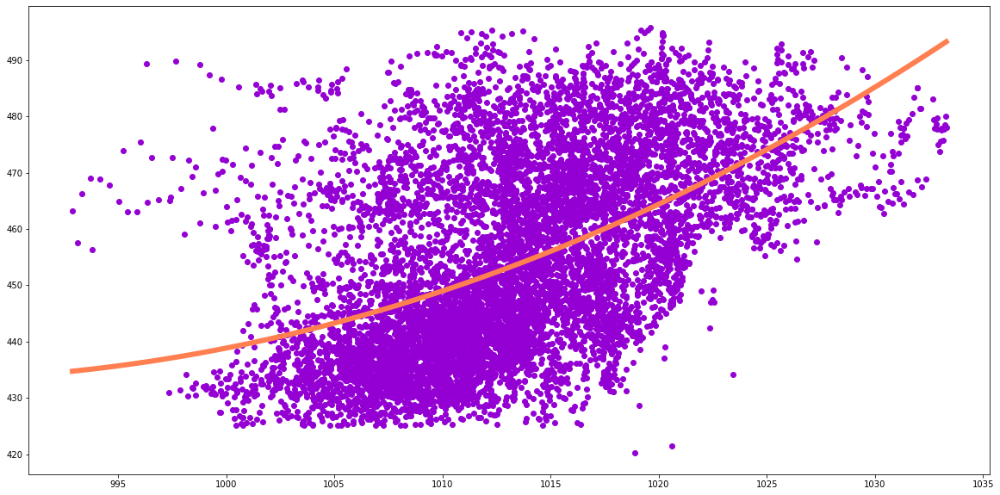

In [28]:
ap_inds = df.AP.ravel().argsort()  # Sort x values and get index    
ap_x = df.AP.ravel()[ap_inds].reshape(-1,1)
ap_y = df.PE[ap_inds] #Sort y according to x sorted index
ap_xp = polynomial_features.fit_transform(ap_x)

ap_model = sm.OLS(ap_y, ap_xp).fit()
ap_ypred = ap_model.predict(ap_xp) 
print(ap_model.summary())
plt.figure(figsize=(20,10))
plt.scatter(ap_x,ap_y,color='darkviolet')
plt.plot(ap_x,ap_ypred,color='coral',linewidth=6)
plt.show()

                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.154
Model:                            OLS   Adj. R-squared:                  0.153
Method:                 Least Squares   F-statistic:                     579.2
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:13   Log-Likelihood:                -39923.
No. Observations:                9568   AIC:                         7.985e+04
Df Residuals:                    9564   BIC:                         7.988e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        468.4135     10.545     44.422      0.0

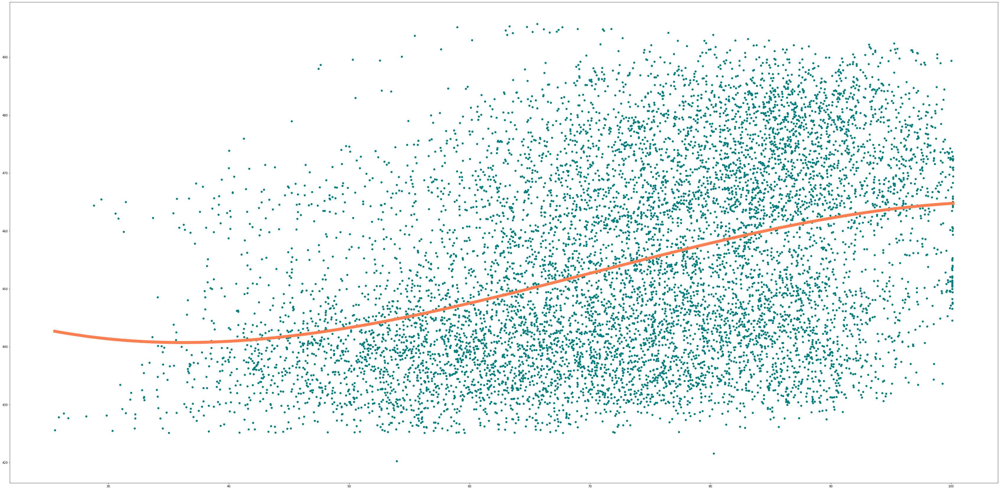

In [29]:
rh_inds = df.RH.ravel().argsort()  # Sort x values and get index    
rh_x = df.RH.ravel()[rh_inds].reshape(-1,1)
rh_y = df.PE[rh_inds] #Sort y according to x sorted index
rh_xp = polynomial_features.fit_transform(rh_x)

rh_model = sm.OLS(rh_y, rh_xp).fit()
rh_ypred = rh_model.predict(rh_xp) 
print(rh_model.summary())
plt.figure(figsize=(60,30))
plt.scatter(rh_x,rh_y,color='teal')
plt.plot(rh_x,rh_ypred,color='coral',linewidth=10)


<span style="color:darkblue">
For predictor AT, the p value for all the linear, quadratic and cubic terms is 0 <0.05.  The F-statistic value is also minimal. So there is an evidence of nonlinear association between AT and PE.
</br>For predictor V, the p values for the quadratic term is greater than 0.05 and hence not statistically significant. Hence, for V , the p values suggest the adequacy for a cubic fit.There is an evidence for a non linear association (cubic)between V and target PE 
</br>
For predictor AP, the p value for all the linear, quadratic and cubic terms is 0 <0.05.So there is an evidence of nonlinear association between AP and PE.
</br>
For predictor RH, the p value for all the linear, quadratic and cubic terms is 0 <0.05.So there is an evidence of nonlinear association between RH and PE.
</span>

(g) Is there evidence of association of interactions of predictors with the response? To
answer this question, run a full linear regression model with all pairwise interaction
terms and state whether any interaction terms are statistically significant.

### POLYNOMIAL REGRESSION WITH PAIRWISE INTERACTIONS

In [30]:
interaction_model = smf.ols(formula='PE ~ AT+ V + AP + RH  + AT:V + AT:AP + AT:RH + V:AP + V:RH + AP:RH', data=df).fit()
interaction_model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     PE   R-squared:                       0.936
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                 1.405e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:13   Log-Likelihood:                -27548.
No. Observations:                9568   AIC:                         5.512e+04
Df Residuals:                    9557   BIC:                         5.520e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    685.7825     78.640      8.721      0.000     531.631     839.934
AT            -4.3470      2.373     -1.832      0.067      -8.999       0.305
V             -7.6749      1.351     -5.682      0.000     -10.323      -5.027
AP            -0.1524      0.077     -1.983      0.047      -0.303      -0.002
RH             1.5709      0.773      2.031      0.042       0.055       3.087
AT:V           0.0210      0.001     23.338      0.000       0.019       0.023
AT:AP          0.0018      0.002      0.752      0.452      -0.003       0.006
AT:RH         -0.0052      0.001     -6.444      0.000      -0.007      -0.004
V:AP           0.0068      0.001      5.135      0.000       0.004       0.009
V:RH           0.0008      0.000      1.716      0.086      -0.000       0.002
AP:RH         -0.0016      0.001     -2.125      0.034      -0.003      -0.000
==============================================================================
Omnibus:                     1454.609   Durbin-Watson:                   2.030
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             9170.848
Skew:                          -0.574   Prob(JB):                         0.00
Kurtosis:                       7.657   Cond. No.                     1.70e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.7e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<span style="color:darkblue">

From the above summary, 
AT individually is an statistically Insignificant predictor(p>0.05)<br>
AT:AP is statistically Insignificant predictor(p>0.05)<br>
V:RH is statistically Insignificant predictor (p>0.05)<br>
Although AT as predictor is insignificant, we can see that the interaction AT:V, AT:RH are significant.<br>

There is an evidence of association of interactions of predictors with the response, as p values of V,AP,RH,AT:V,AT:RH,V:AP,AP:RH is less than 0.05.
R sqaured value is 0.936 (high)

</span>

h) Can you improve your model using possible interaction terms or nonlinear associations between the predictors and response? Train the regression model on a randomly selected 70% subset of the data with all predictors. Also, run a regression model involving all possible interaction terms and quadratic nonlinearities, and remove insignificant variables using p-values (be careful about interaction terms). Test both models on the remaining points and report your train and test MSEs.

### SPLITTING TRAIN AND TEST SET

In [31]:
##setting random state to give consistent results for all experiments
train_set, test_set=train_test_split(df, train_size=0.7,test_size=0.3,random_state=12)
test_X=test_set[['AT','V','AP',"RH"]]
test_Y=test_set['PE']

train_X=train_set[['AT','V','AP',"RH"]]
train_Y=train_set['PE']

### MULTIPLE REGRESSION MODEL WITH PREDICTORS AT,V,AP,RH

In [32]:
#MODEL
multi_reg_model = smf.ols(formula='PE ~ AT + V + AP + RH', data=train_set).fit() 

print('*****************************MULTI REGRESSION MODEL WITH ALL THE PREDICTORS***********************\n\n')
print(multi_reg_model.summary())

# now generate predictions
pred_test_Y= multi_reg_model.predict(test_X)
pred_train_Y= multi_reg_model.predict(train_X)

##adding to a variable for summary table in j question
test_mse_4_predictors = metrics.mean_squared_error(test_Y.values, pred_test_Y.values)

print("\n\n\nMean squared error - Test Data", test_mse_4_predictors)
print("Mean squared error - Train Data", metrics.mean_squared_error(train_Y.values, pred_train_Y.values))



*****************************MULTI REGRESSION MODEL WITH ALL THE PREDICTORS***********************


                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.928
Method:                 Least Squares   F-statistic:                 2.149e+04
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:13   Log-Likelihood:                -19667.
No. Observations:                6697   AIC:                         3.934e+04
Df Residuals:                    6692   BIC:                         3.938e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------

In [33]:
print('**************COMPLETE MULTI REGRESSION MODEL WITH ALL THE PREDICTORS, QUADRATIC , INTERACTIONS*********************\n\n')

train_x_copy, train_y_copy = train_set[['AT','V','AP',"RH"]], train_set['PE']
test_x_copy=test_set[['AT','V','AP',"RH"]]
test_y_copy=test_set['PE']

poly = PolynomialFeatures(degree=2)
poly_features = poly.fit_transform(train_x_copy)
full_model = sm.OLS(train_y_copy, poly_features).fit()
poly_test_X = poly.fit_transform(test_x_copy)
pred_y_full_model=full_model.predict(poly_test_X) 

poly_train_X = poly.fit_transform(train_x_copy)
pred_train_y_full_model=full_model.predict(poly_train_X) 


print(full_model.summary())
test_mse_full_model_non_linear_plus_interactions = mse(test_y_copy, pred_y_full_model)
print("\n\nMean Squared Error (MSE) - Test Data:",test_mse_full_model_non_linear_plus_interactions )
print("Mean Squared Error (MSE) - Train Data:", mse(train_y_copy, pred_train_y_full_model))



**************COMPLETE MULTI REGRESSION MODEL WITH ALL THE PREDICTORS, QUADRATIC , INTERACTIONS*********************


                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     7056.
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:13   Log-Likelihood:                -19228.
No. Observations:                6697   AIC:                         3.849e+04
Df Residuals:                    6682   BIC:                         3.859e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------

In [34]:
terms = poly.get_feature_names(column_names)
display={}
data=pd.DataFrame(full_model.pvalues)
i=0
full_model
for term in terms:
    display[term]=data[0][i]
    i=i+1

display
    

{'1': 8.724810135315818e-07,
 'AT': 0.051650352121563006,
 'V': 0.1995295691359521,
 'AP': 1.2475813304892258e-07,
 'RH': 0.00022479850313691214,
 'AT^2': 1.335013127767308e-05,
 'AT V': 0.00031041542082293593,
 'AT AP': 0.2016661739572883,
 'AT RH': 0.0007812401307972915,
 'V^2': 0.18235897988480737,
 'V AP': 0.29555800852086517,
 'V RH': 0.3575001988917619,
 'AP^2': 1.1223277014658523e-07,
 'AP RH': 0.0004085218277522002,
 'RH^2': 5.39769106028537e-10}

#### REMOVAL OF INSIGNIFICANT FEATURES
<span style="color:darkblue">
    Remove AT:AP,&nbsp V^2, &nbsp V:AP,&nbsp V:RH predictors as they are not statistically significant (p<0.05).<br>
    p-value of Feature V is >0.05. However, there are other interaction terms like AT:V that are significant. By hierarchical principle, we cannot remove predictor 'V'.
 <br>
Significant Features: AT,V,AP,RH,AT^2,AT:V,AT:RH,AP^2,AP_RH,RH^2 
    
</span>


### Regression Model (quadratic terms and non linearities) - After removal of  insignificant features

In [35]:

poly_1 = PolynomialFeatures(degree=2)
poly_features_1 = poly_1.fit_transform(train_x_copy)

dataframe_poly=pd.DataFrame(poly_features_1, columns=["constant","AT","V","AP","RH","AT^2","AT*V","AT*AP","AT*RH","V^2","V*AP","V*RH","AP^2","AP*RH","RH^2"])
new_df= dataframe_poly.drop(columns=['AT*AP','V^2','V*AP','V*RH'])

new_full_model = sm.OLS(train_y_copy,new_df.values).fit()

poly_test_X = poly.fit_transform(test_x_copy)
updated_poly_test_X=pd.DataFrame(poly_test_X, columns=["constant","AT","V","AP","RH","AT^2","AT*V","AT*AP","AT*RH","V^2","V*AP","V*RH","AP^2","AP*RH","RH^2"])
new_poly_test_X= updated_poly_test_X.drop(columns=['AT*AP','V^2','V*AP','V*RH'])

pred_y_full_model=new_full_model.predict(new_poly_test_X) 

poly_train_X = poly.fit_transform(train_x_copy)
updated_poly_train_X=pd.DataFrame(poly_train_X, columns=["constant","AT","V","AP","RH","AT^2","AT*V","AT*AP","AT*RH","V^2","V*AP","V*RH","AP^2","AP*RH","RH^2"])
new_poly_train_X= updated_poly_train_X.drop(columns=['AT*AP','V^2','V*AP','V*RH'])

pred_train_y_full_model=new_full_model.predict(new_poly_train_X) 


print(new_full_model.summary())
test_mse_full_model_non_linear_plus_interactions_after_removal = mse(test_y_copy, pred_y_full_model)
print("Mean Squared Error (MSE) - Test Data:", test_mse_full_model_non_linear_plus_interactions_after_removal)
print("Mean Squared Error (MSE) - Train Data:", mse(train_y_copy, pred_train_y_full_model))


                            OLS Regression Results                            
Dep. Variable:                     PE   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     9862.
Date:                Fri, 11 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:00:13   Log-Likelihood:                -19235.
No. Observations:                6697   AIC:                         3.849e+04
Df Residuals:                    6686   BIC:                         3.857e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.048e+04   1119.163     -9.365      0.0

### OBSERVATIONS
<span style="color:darkblue">
- The multiple regression model with just the predictors - AT,V,AP,RH, has train mse of 20.81, test mse of 20.67, r-squared as 0.927. 
 <br>
- The multiple regression model with all interactions and quadratic coeff, has train mse of 18.25, test mse of 17.76, r-squared as 0.937.
    <br>
- After removal of insignificant features from The multiple regression model with all interactions and quadratic coeff, we have train mse of 18.29, test mse of 17.80, r-squared as 0.937.
    <br>
AS stated and shown in the previous cells, r-squared has increased from 0.927 to 0.937 in the multiple regression model with all interactions and quadratic coeff as compared to the model with just the predictors - AT,V,AP,RH. This is due to addition fo new significant features in the model that comprises of interactions and non linear predictors <br>
   After removal of insignificant features from The multiple regression model, the rsquare remains the same before and after removal. 
    <br>The model is better after removal. This can be seen in p being 0, for all predictors after removal.
    <br>

    
</span>

(i) KNN Regression:
i. Perform k-nearest neighbor regression for this dataset using both normalized
and raw features. Find the value of k ∈ {1, 2, . . . , 100} that gives you the
best fit. Plot the train and test errors in terms of 1/k.

### KNN REGRESSION UTILITY METHODS

In [36]:
def KNNRegr(train_x, train_y,test_x,test_y):
    error_k_map={}
    for k in range(1,101,1):
        knn = KNeighborsRegressor(n_neighbors=k)
        knn.fit(train_x, train_y)
        pred_y=knn.predict(test_x)
        mse =mean_squared_error(test_y, pred_y)
        error_k_map[k]=mse
    return error_k_map

def get_keys(val,dictionary):
    k_with_min_mse=[]
    for key, value in dictionary.items():
         if val == value:
            k_with_min_mse.append(key)
 
    return k_with_min_mse


def getNormalizedData(train_x, test_x):
    min_max_scaler = preprocessing.MinMaxScaler()
    scaled_train_x=min_max_scaler.fit_transform(train_x)
    scaled_test_x=min_max_scaler.fit_transform(test_x)
    df_scaled_train_x=pd.DataFrame(scaled_train_x)
    df_scaled_test_x=pd.DataFrame(scaled_test_x)
    
    return df_scaled_train_x,df_scaled_test_x
    


### KNN Regression with RAW FEATURES

Min MSE value: 16.119712660397077
K values with min MSE: [5]
Best K Value: 5


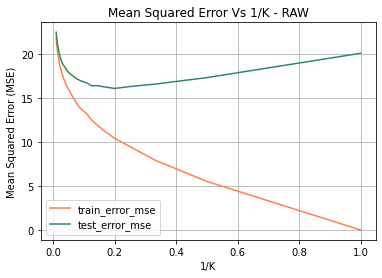

In [37]:
trainErrorDict=KNNRegr(train_X,train_Y,train_X, train_Y)
testErrorDict=KNNRegr(train_X,train_Y,test_X, test_Y)

k_values = np.arange(1,101,1)    
inverted_k_values=1/k_values

min_mse=min(testErrorDict.values())
print("Min MSE value:", min_mse)

k_values_with_min_mse=get_keys(min_mse,testErrorDict)
print("K values with min MSE:",k_values_with_min_mse )
print("Best K Value:", max(k_values_with_min_mse))

plt.plot(inverted_k_values, trainErrorDict.values(), color="coral",label = "train_error_mse")
plt.plot(inverted_k_values,testErrorDict.values(), color="seagreen", label ="test_error_mse")
plt.title("Mean Squared Error Vs 1/K - RAW")
plt.xlabel("1/K")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid()
plt.show()

### KNN Regression with NORMALIZED FEATURES

Min MSE value: 15.870959446882633
K values with min MSE: [5]
Best K Value: 5


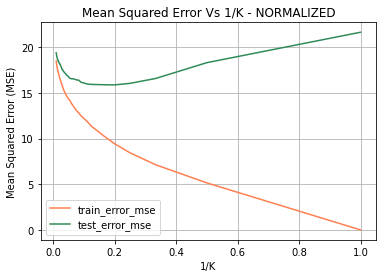

In [38]:
normalized_train_X,normalized_test_X=getNormalizedData(train_X, test_X)
normalized_train_X.columns=["AT","V","AP","RH"]
normalized_test_X.columns=["AT","V","AP","RH"]

trainErrorDict_n=KNNRegr(normalized_train_X,train_Y,normalized_train_X, train_Y)
testErrorDict_n=KNNRegr(normalized_train_X,train_Y,normalized_test_X, test_Y)

k_values = np.arange(1,101,1)    
inverted_k_values=1/k_values

min_mse_n=min(testErrorDict_n.values())
print("Min MSE value:", min_mse_n)

k_values_with_min_mse_n=get_keys(min_mse_n,testErrorDict_n)
print("K values with min MSE:",k_values_with_min_mse_n )
print("Best K Value:", max(k_values_with_min_mse_n))

plt.plot(inverted_k_values, trainErrorDict_n.values(), color="coral",label = "train_error_mse")
plt.plot(inverted_k_values,testErrorDict_n.values(), color="seagreen", label ="test_error_mse")
plt.title("Mean Squared Error Vs 1/K - NORMALIZED")
plt.xlabel("1/K")
plt.ylabel("Mean Squared Error (MSE)")
plt.legend()
plt.grid()
plt.show()

(j) Compare the results of KNN Regression with the linear regression model that has
the smallest test error and provide your analysis.

### COMPARISON OF KNN REGRESSION WITH LINEAR REGRESSION MODEL(with smallest test error)

In [39]:
table={'Model': ['Test data MSE'],
       'Multiple Regression with just 4 predictors -AT,V,AP,RH':[test_mse_4_predictors],
       'Multiple Regression with interactions and non linear BEFORE removal':[test_mse_full_model_non_linear_plus_interactions],
       'Multiple Regression with interactions and non linear AFTER removal':[test_mse_full_model_non_linear_plus_interactions_after_removal],
       'KNN Regression - Raw':[min_mse],
       'KNN Regression- Normalized':[min_mse_n]
}

summarized_mse=pd.DataFrame(table)
summarized_mse

,Model,"Multiple Regression with just 4 predictors -AT,V,AP,RH",Multiple Regression with interactions and non linear BEFORE removal,Multiple Regression with interactions and non linear AFTER removal,KNN Regression - Raw,KNN Regression- Normalized
0,Test data MSE,20.679236,17.767613,17.803007,16.119713,15.870959


<span style="color:darkblue">
Lowest test MSE for multiple linear regression model is 17.76, when all non linearities and interactions are considered. The test MSEs of KNN is slightly lower (almost equal) than the smallest  test error in the linear regression model with non linearities and interactions.

KNN is a non parametric model, so it doesnt assume the distribution of the data it is modeling.Linear Regression have a strong assumption for f(X). With KNN, we cannot identify important predictors that are significant. Although the test mse for KNN is slightly lower, from an interpretability standpoint, we can prefer Linear Regression. Linear regression make sense for data with less dimensions.
</span>

# 2.4.1 AND 2.4.7

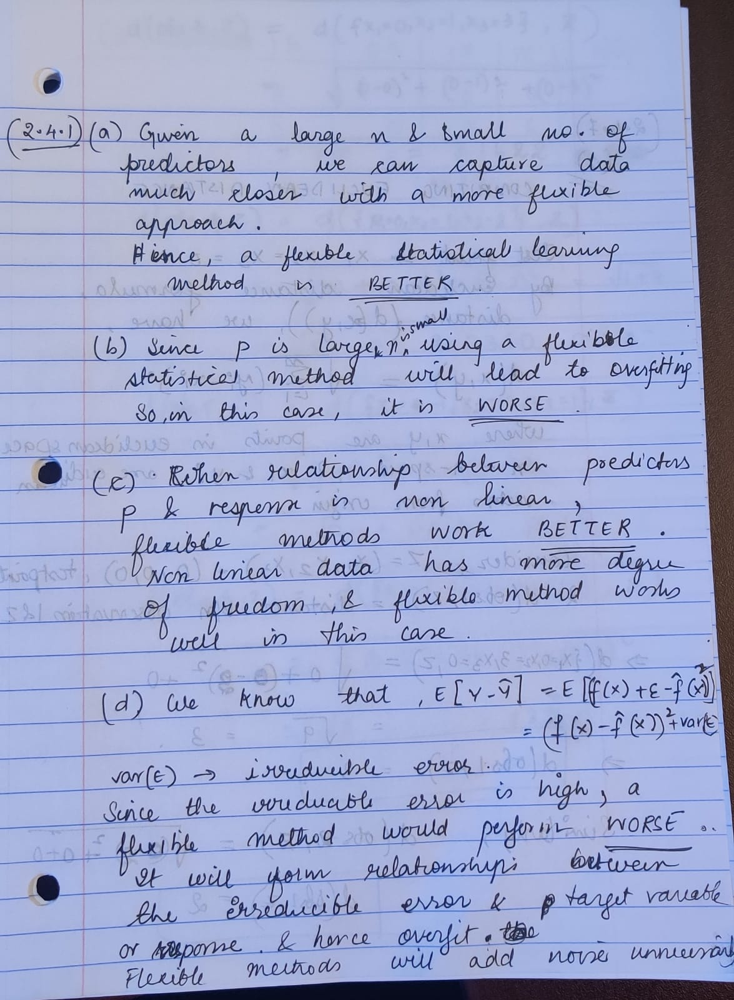


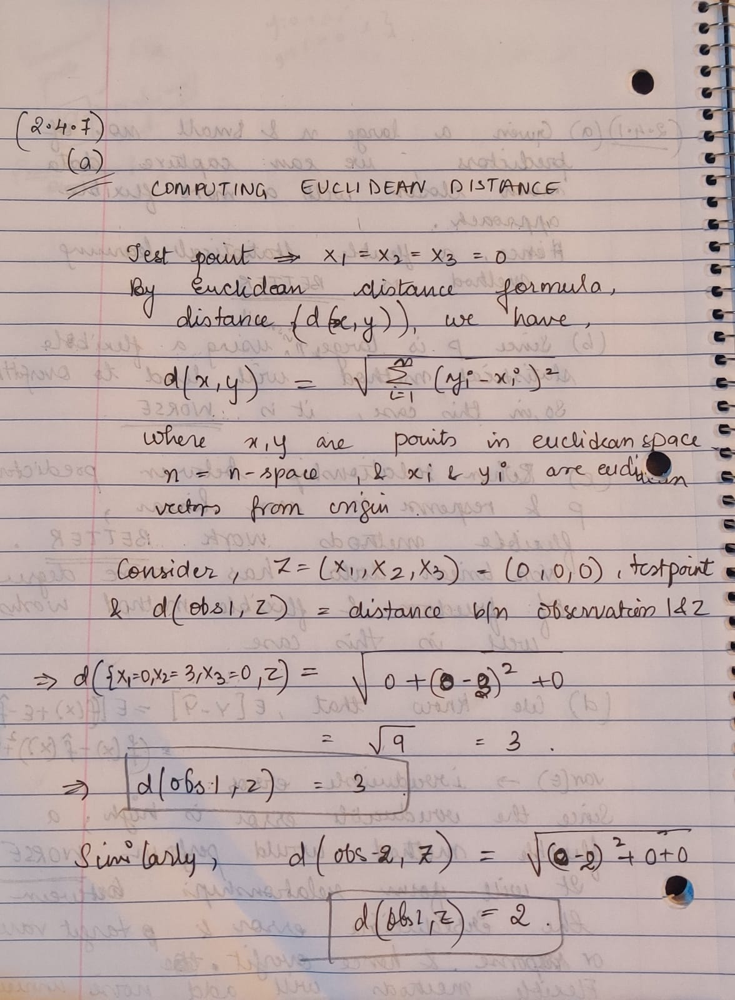

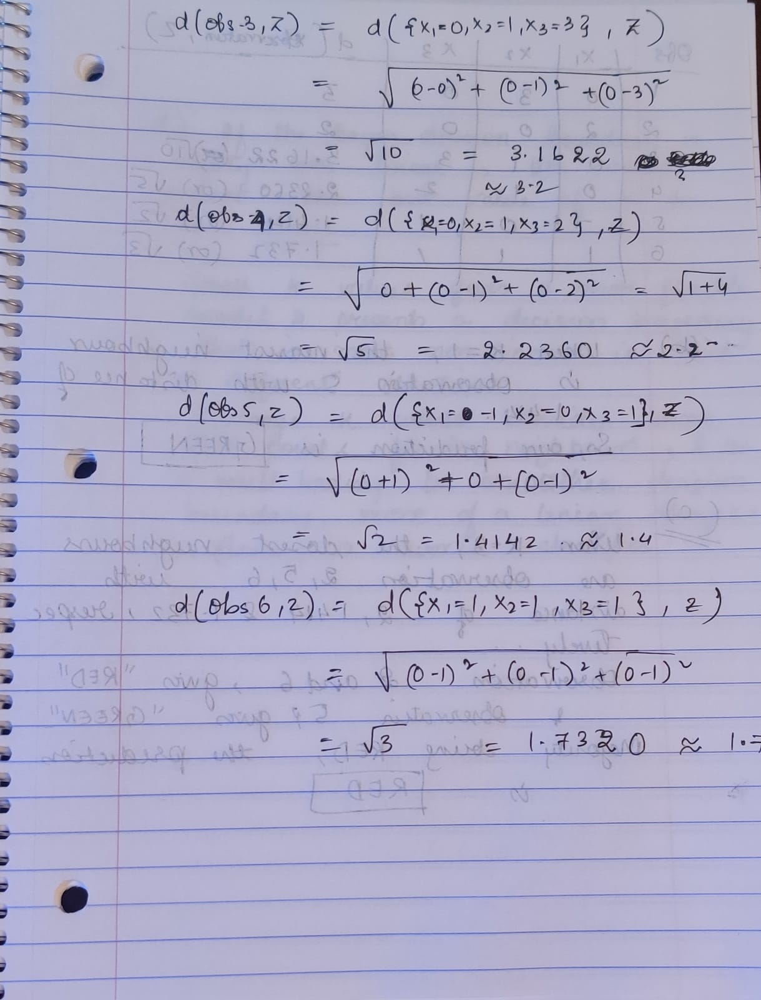

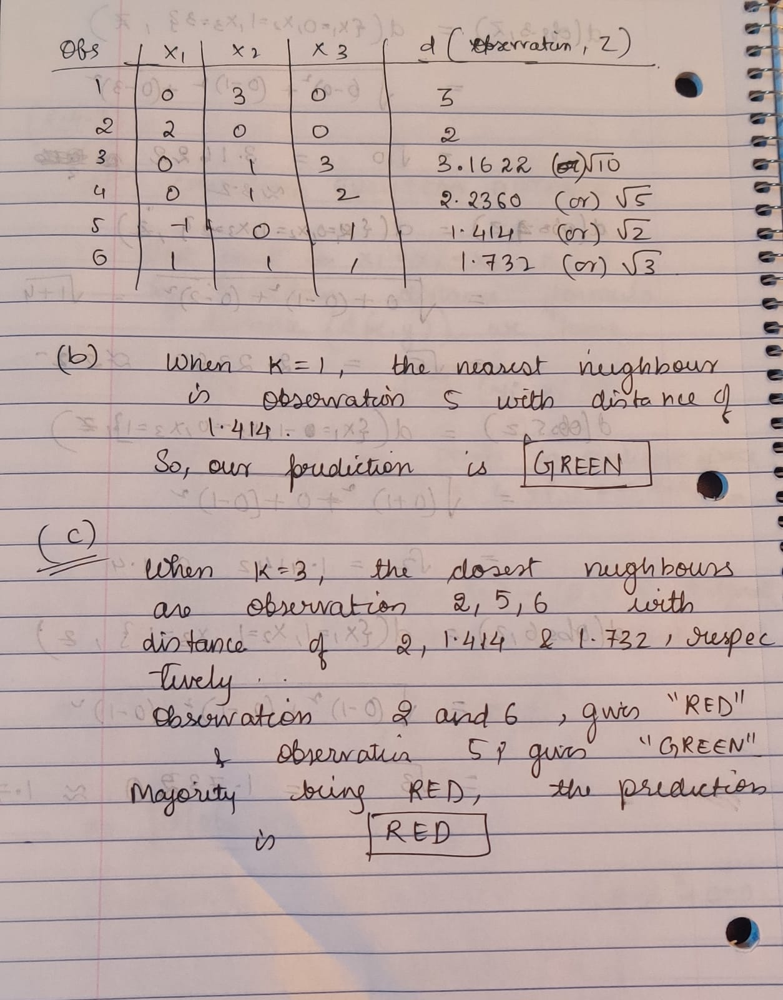

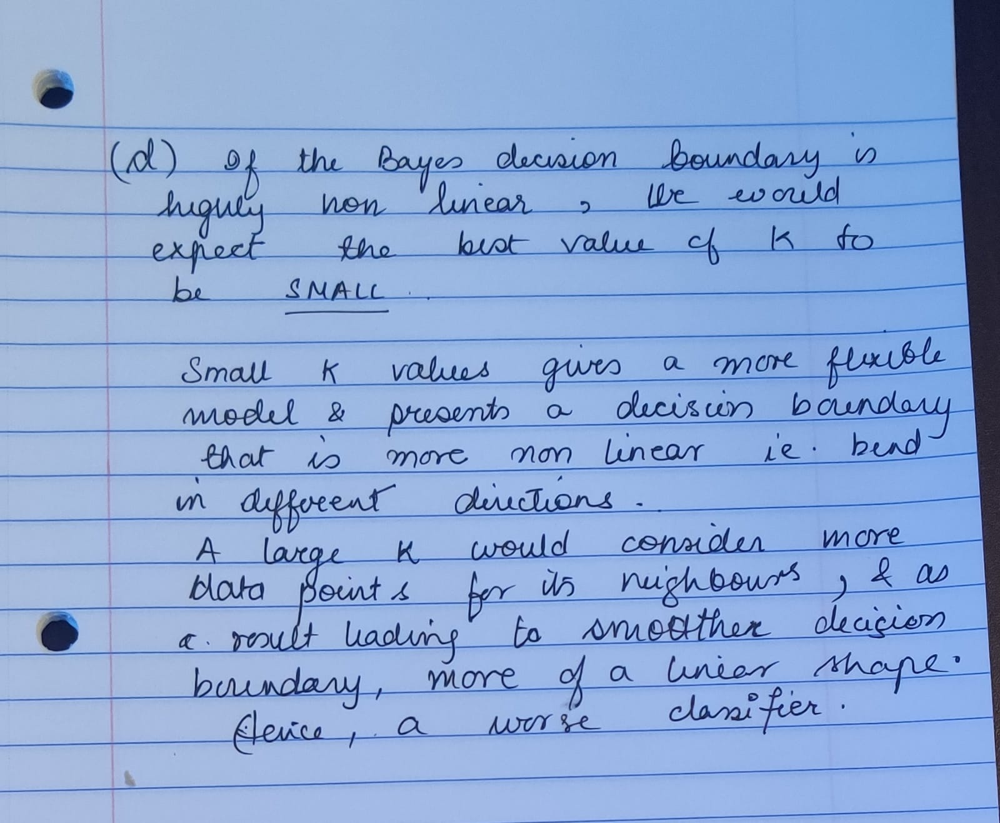


REFERENCES

https://www.statisticshowto.com/probability-and-statistics/regression-analysis/find-a-linear-regression-equation/#Leverage
https://medium.com/swlh/identify-outliers-with-pandas-statsmodels-and-seaborn-2766103bf67c
        
        